# Figure S5 - Read Until Efficiency

## Simulated sequencing of Mb Genomes



In [4]:
library(ggplot2)
library("gridExtra")
library("plyr")
library("rgl")

To investigate the consequences of increasing genome size on mapping of reads, we used a 2 megabase region of Yersinia Pestis and simulated the selective sequencing of two 500kb regions on 512 channels.

In [8]:
Pestis512channelsim128oddeven = read.csv("data/simulations/512channels_pestis_128oddeven_v2.csv", header = TRUE,sep=",")

Pestis512channelsim128oddeven$OddEven = "Read Until"
Pestis512channelsim128oddeven$OddEven[Pestis512channelsim128oddeven$channel_name %% 2 == 0]<-"No Read Until"

head (Pestis512channelsim128oddeven)

,channel_name,seq_name,seq_index,seq_length,seq_head,read_number,read_start,read_event_count,read_reason,OddEven
1,345,AE009952,1340396,11010,AGATAATCTCCGTTGT,2,2397,785,Unblock,RU
2,340,AE009952,213478,11007,GAAACTTAAAGGCCAC,2,2397,807,Unblock,RU
3,347,AE009952,254835,10978,TGCAACCCAAAATTGG,2,2397,807,Unblock,RU
4,342,AE009952,1182461,10994,CATCAGTCTTTCTGCT,2,2397,835,Unblock,RU
5,296,AE009952,2113941,10977,GGTCGAAGGCTCACCA,2,2397,1195,Unblock,RU
6,299,AE009952,1186034,10978,AACAAACGGACTTTAG,2,2397,1195,Unblock,RU


,channel_name,seq_name,seq_index,seq_length,seq_head,read_number,read_start,read_event_count,read_reason,OddEven
1,345,AE009952,1185780,10979,CTTTATTACCCGCGCC,2,2432,407,Unblock,Read Until
2,347,AE009952,1907202,10992,AATCTGCATTGATTAT,2,2432,434,Unblock,Read Until
3,295,AE009952,569801,11005,TCCCAAGGGTATGGCT,2,2432,458,Unblock,Read Until
4,297,AE009952,1270292,10980,GCGATTTACCGTTTTA,2,2432,458,Unblock,Read Until
5,299,AE009952,2114717,11071,TCAAGGCTGGCAGGCC,2,2432,458,Unblock,Read Until
6,349,AE009952,2002410,10987,CGAGGGTATTAATTTG,2,2432,458,Unblock,Read Until


The significant reduction in efficiency of the squiggle matching is clear. Rejected read length has increased dramatically. 

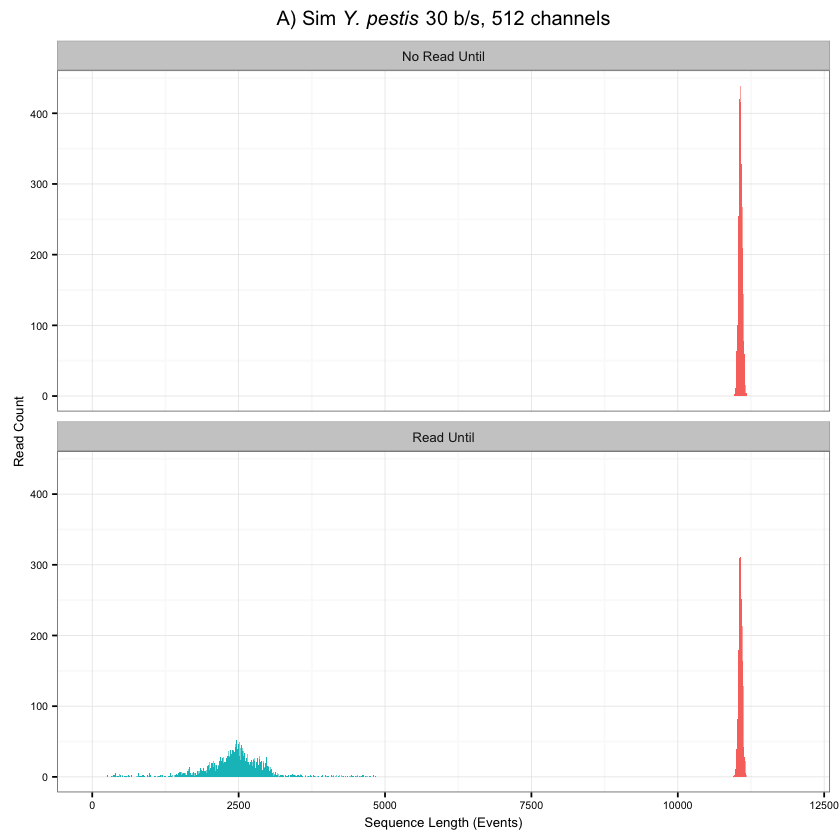

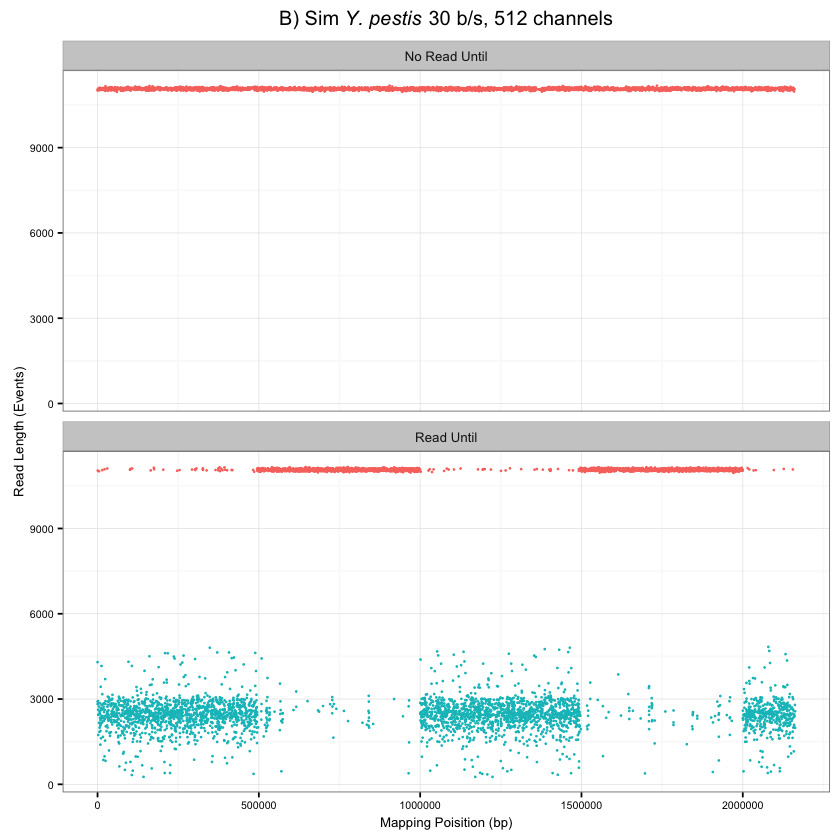

In [9]:
figs5a=ggplot(data=subset(Pestis512channelsim128oddeven,read_reason!="Stopped"),aes(x=read_event_count,fill=read_reason)) + geom_histogram(binwidth=10,position="identity",alpha = 1) + facet_wrap(~OddEven,ncol=1)+ coord_cartesian(xlim = c(0,12000)) + theme_bw() + theme(text = element_text(size=8),axis.title=element_text(size=8),plot.title = element_text(size=12),strip.text = element_text(size=8, lineheight=0.5),legend.title = element_blank(),legend.position="none")+ labs(y="Read Count",x="Sequence Length (Events)",title = expression(paste("A) Sim ", italic("Y. pestis"), " 30 b/s, 512 channels")))

figs5b=ggplot(data=subset(Pestis512channelsim128oddeven,read_reason!="Stopped"), aes(y=read_event_count,x=seq_index,color=read_reason))+ facet_wrap(~OddEven,ncol=1)  + geom_point(size = .1) + theme_bw() + theme(text = element_text(size=8),axis.title=element_text(size=8),plot.title = element_text(size=12),strip.text = element_text(size=8, lineheight=0.5),legend.title = element_blank(),legend.position="none")+ scale_color_discrete(name=NULL) + guides(colour=guide_legend(override.aes=list(size=2)))+labs(y="Read Length (Events)",x="Mapping Poisition (bp)",title = expression(paste("B) Sim ", italic("Y. pestis"), " 30 b/s, 512 channels")))

figs5a

figs5b

This run was limited to 8 cores processing 256 channels (read until is not run on even numbered channels).
To simulate a doubling in cores, we reduced the channel count to effectively 128 channels:

,channel_name,seq_name,seq_index,seq_length,seq_head,read_number,read_start,read_event_count,read_reason,OddEven
1,217,AE009952,241412,11055,TGAAACGGCACTTTTT,2,1903,430,Unblock,Read Until
2,213,AE009952,1114782,10987,ATACTGAAGATTATTA,2,1903,451,Unblock,Read Until
3,133,AE009952,1118213,10948,GGAAGATACGTGCAGA,2,1903,507,Unblock,Read Until
4,135,AE009952,1397260,10924,ACAGATTGAAACCAAA,2,1903,658,Unblock,Read Until
5,95,AE009952,75164,11018,ACAGTTCCAGCAGGGC,2,1903,684,Unblock,Read Until
6,225,AE009952,1052402,11025,GCAGCCAGCGCAGACC,2,1903,684,Unblock,Read Until


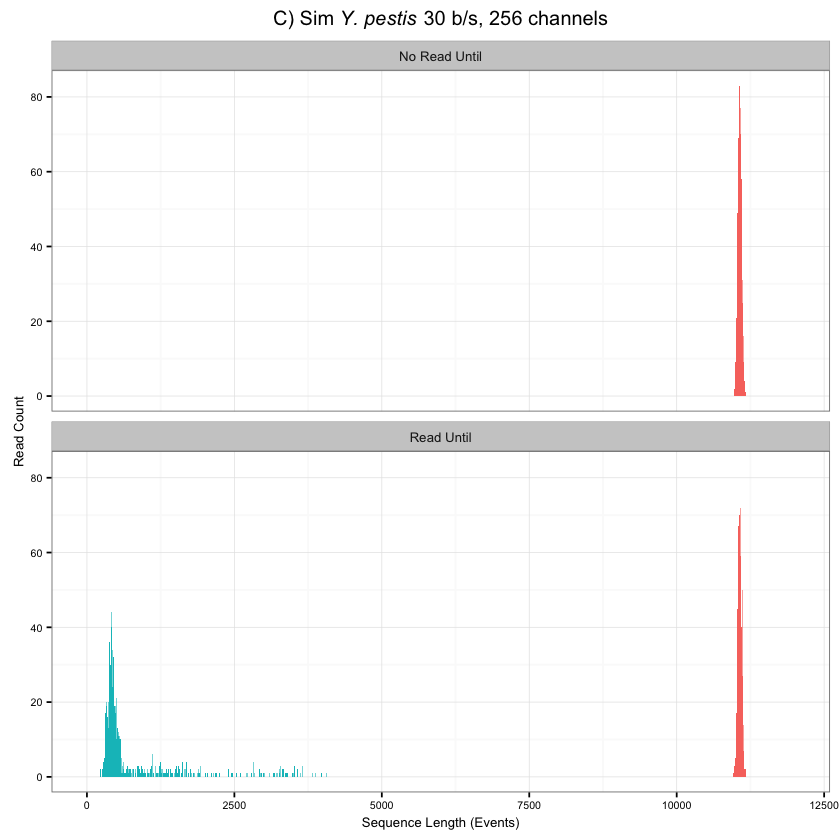

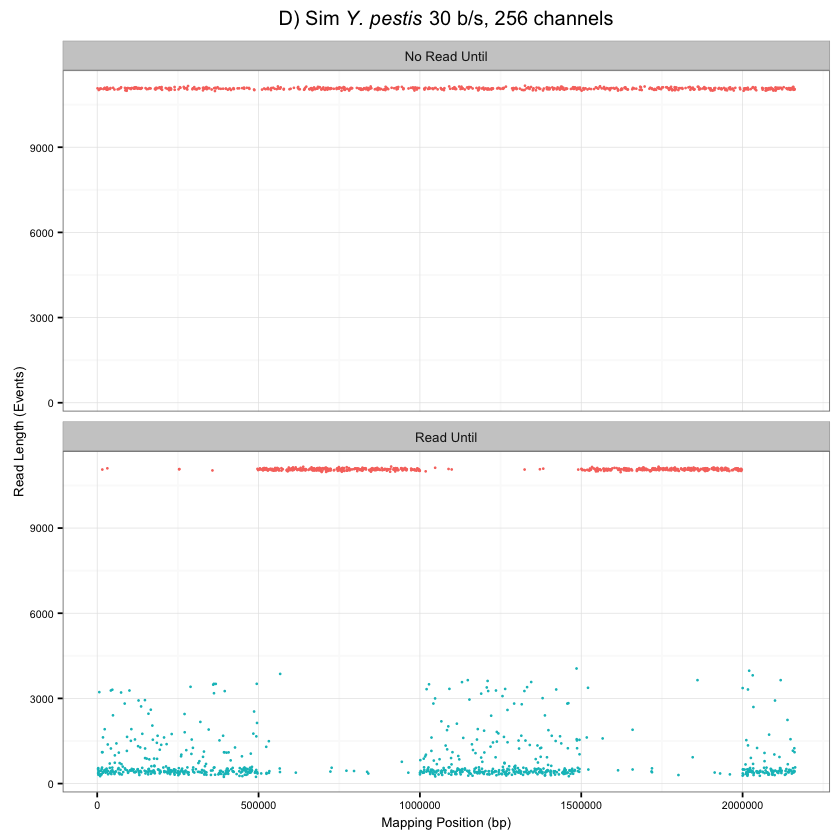

In [10]:
Pestis512channelsim128oddeven256 = read.csv("data/simulations/512channels_pestis_128oddeven256.csv", header = TRUE,sep=",")

Pestis512channelsim128oddeven256$OddEven = "Read Until"
Pestis512channelsim128oddeven256$OddEven[Pestis512channelsim128oddeven256$channel_name %% 2 == 0]<-"No Read Until"

head (Pestis512channelsim128oddeven256)
figs7c=ggplot(data=subset(Pestis512channelsim128oddeven256,read_reason!="Stopped"),aes(x=read_event_count,fill=read_reason)) + geom_histogram(binwidth=10,position="identity",alpha = 1) + facet_wrap(~OddEven,ncol=1)+ coord_cartesian(xlim = c(0,12000))+theme_bw() + theme(text = element_text(size=8),axis.title=element_text(size=8),plot.title = element_text(size=12),strip.text = element_text(size=8, lineheight=0.5),legend.title = element_blank(),legend.position="none")+ labs(y="Read Count",x="Sequence Length (Events)",title = expression(paste("C) Sim ", italic("Y. pestis"), " 30 b/s, 256 channels")))

figs7d=ggplot(data=subset(Pestis512channelsim128oddeven256,read_reason!="Stopped"), aes(y=read_event_count,x=seq_index,color=read_reason))+ facet_wrap(~OddEven,ncol=1)  + geom_point(size = .1) + theme_bw() + theme(text = element_text(size=8),axis.title=element_text(size=8),plot.title = element_text(size=12),strip.text = element_text(size=8, lineheight=0.5),legend.title = element_blank(),legend.position="none")+ scale_color_discrete(name=NULL) + guides(colour=guide_legend(override.aes=list(size=2)))+ labs(y="Read Length (Events)",x="Mapping Position (bp)",title = expression(paste("D) Sim ", italic("Y. pestis"), " 30 b/s, 256 channels")))

figs7c

figs7d

Now we see far faster matching and high accuracy across the 2 megabase genome fraction. To test our ability to map across the entire genome, we reduced the channel count by a further factor of 2:

,channel_name,seq_name,seq_index,seq_length,seq_head,read_number,read_start,read_event_count,read_reason,OddEven
1,21,AE009952,3303439,14074,CCGCCGCCGTTTCTAG,2,2706,661,Unblock,Read Until
2,29,AE009952,2991938,14044,TATACCAATCTCAATG,2,2706,714,Unblock,Read Until
3,87,AE009952,3756593,14127,GGCCTGTATGTCAATT,2,2706,714,Unblock,Read Until
4,121,AE009952,2915568,14019,AATCAACATACCGGGG,2,2706,766,Unblock,Read Until
5,123,AE009952,2259916,14082,AATTTTCAAAACCAGC,2,2706,766,Unblock,Read Until
6,125,AE009952,2802906,14083,ATGACCCGGTCGAGGC,2,2706,1072,Unblock,Read Until


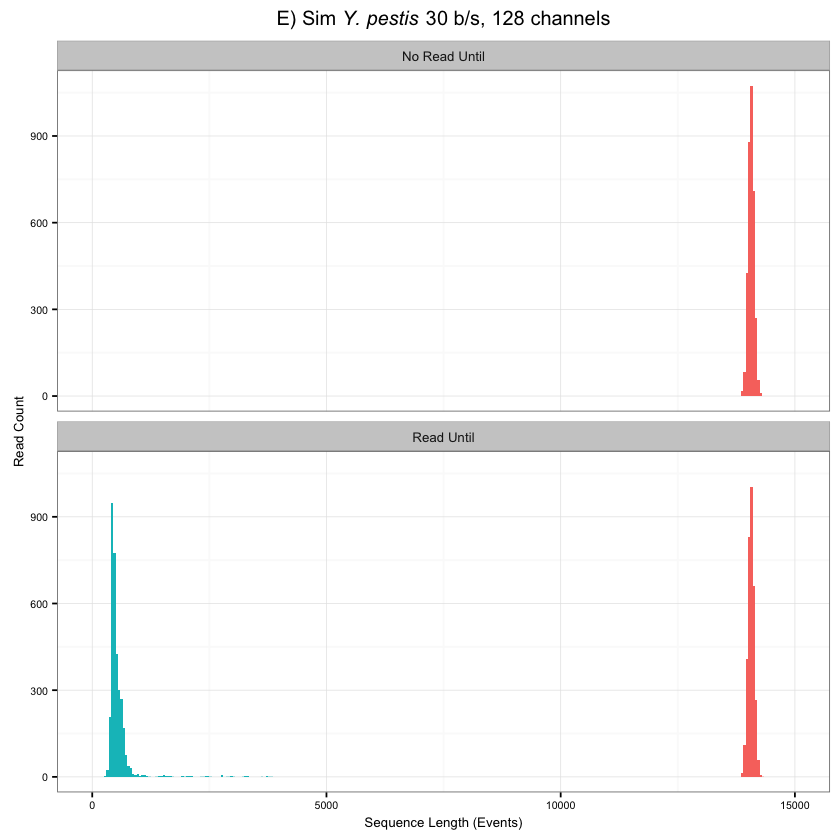

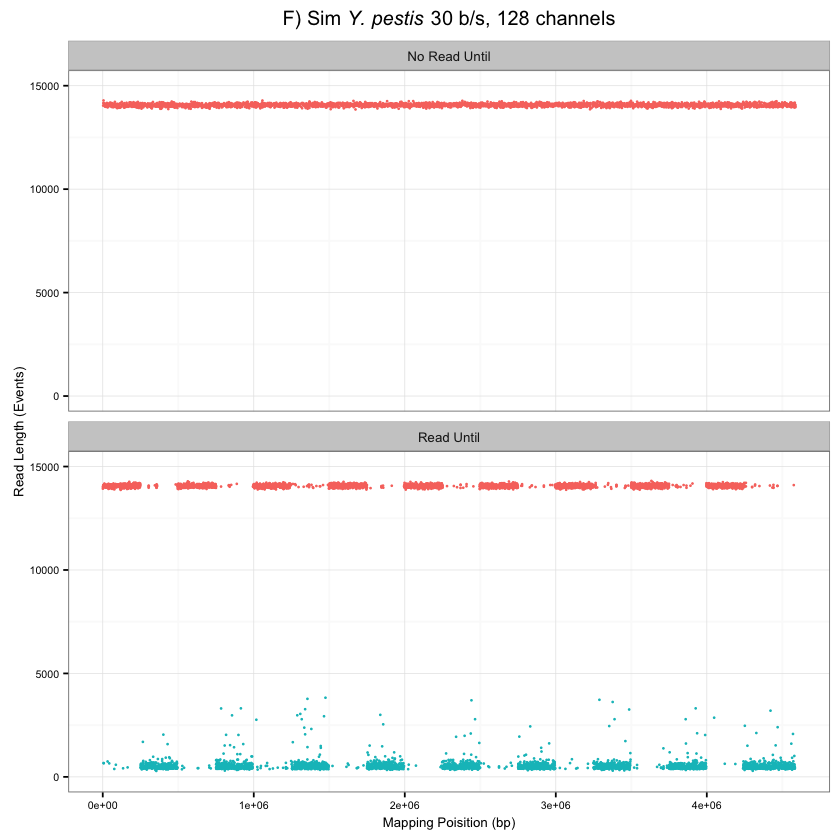

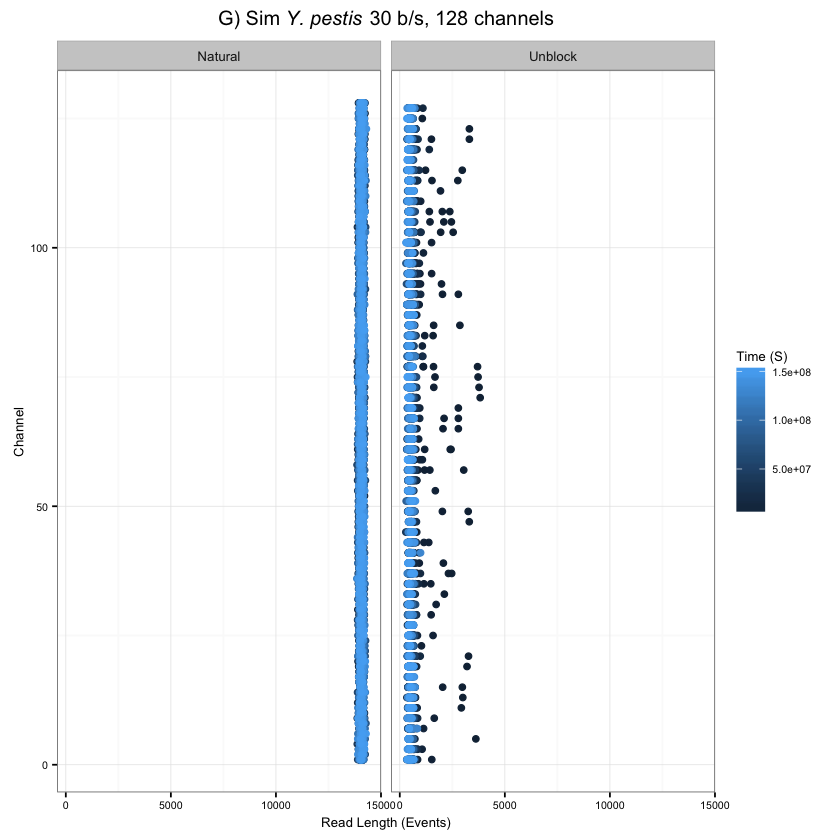

In [11]:
dallPestis512channelsim128oddeven128 = read.csv("data/simulations/dallchannels_pestis_128oddeven128.csv", header = TRUE,sep=",")

dallPestis512channelsim128oddeven128$OddEven = "Read Until"
dallPestis512channelsim128oddeven128$OddEven[dallPestis512channelsim128oddeven128$channel_name %% 2 == 0]<-"No Read Until"

head (dallPestis512channelsim128oddeven128)

figs7e=ggplot(data=subset(dallPestis512channelsim128oddeven128,read_reason!="Stopped"),aes(x=read_event_count,fill=read_reason)) + geom_histogram(binwidth=50,position="identity",alpha = 1) + facet_wrap(~OddEven,ncol=1) + coord_cartesian(xlim = c(0,15000))+theme_bw() + theme(text = element_text(size=8),axis.title=element_text(size=8),plot.title = element_text(size=12),strip.text = element_text(size=8, lineheight=0.5),legend.position="none",legend.title = element_blank())+ labs(y="Read Count",x="Sequence Length (Events)",title = expression(paste("E) Sim ", italic("Y. pestis"), " 30 b/s, 128 channels")))

figs7f=ggplot(data=subset(dallPestis512channelsim128oddeven128,read_reason!="Stopped"), aes(y=read_event_count,x=seq_index,color=read_reason))+ facet_wrap(~OddEven,ncol=1)+ scale_color_discrete(name=NULL) + guides(colour=guide_legend(override.aes=list(size=2)))  + geom_point(size = .1) + coord_cartesian(ylim=c(0,15000))+ theme_bw() + theme(text = element_text(size=8),axis.title=element_text(size=8),plot.title = element_text(size=12),strip.text = element_text(size=8, lineheight=0.5),legend.title=element_text(size=8),legend.position="none")+ labs(y="Read Length (Events)",x="Mapping Poisition (bp)",title = expression(paste("F) Sim ", italic("Y. pestis"), " 30 b/s, 128 channels")))


figs7g=ggplot(data=subset(dallPestis512channelsim128oddeven128,read_reason!="Stopped"),aes(x=read_event_count,y=channel_name,color=read_start)) + geom_point() + facet_wrap(~read_reason,ncol=2)+ theme_bw() + theme(text = element_text(size=8),axis.title=element_text(size=8),plot.title = element_text(size=12),strip.text = element_text(size=8, lineheight=0.5),legend.position="right")+ labs(y="Channel",x="Read Length (Events)",title = expression(paste("G) Sim ", italic("Y. pestis"), " 30 b/s, 128 channels"))) + scale_colour_gradient(name="Time (S)")

figs7e

figs7f

figs7g


Here we see that the reads are rejected in a timely fashion and that sequences can be mapped correcrtly to a longer reference.